<a href="https://colab.research.google.com/github/varun-ml/diffusion-models-tutorial/blob/master/emnist-colab-notebooks/colab_EMNIST_without_conditioning.diffusion_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generating complex densities using Diffusion models

1. moving to alphabets and number generation using diffusion models
    * We will be using JAX
    * Using U-net blocks for modelling the denoising process
    * With class conditioning
    * with batch norm to speed up training

In [ ]:
!pip install einops dm-haiku optax
!pip install dm-tree graphviz imageio[ffmpeg]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 195 kB/s 
     |████████████████████████████████| 352 kB 40.1 MB/s 
     |████████████████████████████████| 154 kB 52.8 MB/s 
     |████████████████████████████████| 85 kB 2.8 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 1.2 MB/s 


In [ ]:
import haiku as hk
import jax
import jax.numpy as jnp
import einops
import math
from typing import Iterator, Mapping, Tuple
from copy import deepcopy
import time
from absl import app
import haiku as hk
import matplotlib.pyplot as plt
import jax
import jax.numpy as jnp
import numpy as np
import optax
import tensorflow_datasets as tfds
import tensorflow as tf
from functools import partial
import math
import os

colab = True

if not colab:
  os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
  jax.config.update('jax_platform_name', 'cpu')
Batch = Tuple[np.ndarray, np.ndarray]

In [ ]:
if colab:
  from google.colab import drive
  drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
train_new_model = True
cont=True
model_name = 'emnist_fixed.jax_version'

import os
import os.path as osp

if not colab:
  data_paths = osp.join(os.getcwd(), 'saved', 'saved_data')
  model_paths = osp.join(os.getcwd(), 'saved','saved_models')
  gifs_dir = osp.join(os.getcwd(), 'gifs')+"/"
  dataset_path = "/home/varun/tensorflow_datasets/"
else:
  data_paths = F"/content/gdrive/MyDrive/EMNIST/data/"
  model_paths = F"/content/gdrive/MyDrive/EMNIST/model/"
  gifs_dir = F"/content/gdrive/MyDrive/EMNIST/gifs/"
  dataset_path = F"/content/gdrive/MyDrive/EMNIST/dataset/"

In [ ]:
# utils 
import pickle

def load_cached(filename):
    with open(filename, 'rb') as ff:
        return pickle.load(ff)
    
def write_cached(data, filename):
    with open(filename, 'wb') as ff:
        pickle.dump(data, ff, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# train model

# ####### i am not getting desired results with the cosine beta schedule from the hugging face repo
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = jnp.linspace(0, timesteps, steps)
    alphas_cumprod = jnp.cos(((x / timesteps) + s) / (1 + s) * jnp.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return jnp.clip(betas, 0.0001, 0.1)

def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return jnp.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return jnp.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    betas = jnp.linspace(-6, 6, timesteps)
    return jnp.sigmoid(betas) * (beta_end - beta_start) + beta_start

In [ ]:
# Train model
timesteps = 200
# betas = linear_beta_schedule(timesteps)
betas = cosine_beta_schedule(timesteps)
alphas = 1 - betas
alphas_ = jnp.cumprod(alphas, axis=0)
variance = 1 - alphas_
sd = jnp.sqrt(variance)

alphas_prev_ = jnp.pad(alphas_[:-1], [1, 0], "constant", constant_values=1.0)
sigma_squared_q_t = (1 - alphas) * (1 - alphas_) / (1 - alphas_prev_)
log_sigma_squared_q_t = jnp.log(1-alphas) + jnp.log(1-alphas_) - jnp.log(1-alphas_prev_)
sigma_squared_q_t_corrected = jnp.exp(log_sigma_squared_q_t)
key = jax.random.PRNGKey(42)

# how to add noise to the data
@jax.jit
def get_noisy(rng, batch, timestep):
    timestep = einops.repeat(timestep, 'b -> b 28 28 1')
    # we will use the reparameterization trick
    # need to generate new keys everytime
    _, noise_key = jax.random.split(rng)
    noise_at_t = jax.random.normal(noise_key, shape=batch.shape)
    added_noise_at_t = jnp.add(batch * jnp.sqrt(alphas_[timestep]), noise_at_t * sd[timestep])
    return added_noise_at_t, noise_at_t

def recover_original(batch, timestep, noise):
    true_data = (batch.sub(noise.mul(sd[timestep]))).div(jnp.sqrt(alphas_[timestep]))
    return true_data

posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)

## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance[1], posterior_variance[1:]]))

# not sure why we are multiplying by 1/2 here
posterior_variance_corrected = jnp.exp(log_posterior_variance)

([<matplotlib.lines.Line2D at 0x7f35c2aeabb0>],
 [<matplotlib.lines.Line2D at 0x7f35b0066970>])

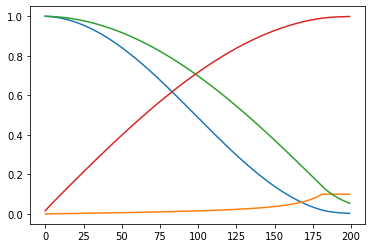

In [ ]:
plt.plot(alphas_), plt.plot(posterior_variance_corrected), plt.plot(jnp.sqrt(alphas_)), plt.plot(sd)

In [ ]:
EMNIST_MEAN = (0.13066373765468597)
EMNIST_STD = (0.30810782313346863)

# adapted from Optax loss -- https://github.com/deepmind/optax/blob/master/optax/_src/loss.py
@jax.jit
def huber_loss(
    predictions,
    targets= None,
    delta= 1.):
  """Huber loss, similar to L2 loss close to zero, L1 loss away from zero.
  If gradient descent is applied to the `huber loss`, it is equivalent to
  clipping gradients of an `l2_loss` to `[-delta, delta]` in the backward pass.
  References:
    [Huber, 1964](www.projecteuclid.org/download/pdf_1/euclid.aoms/1177703732)
  Args:
    predictions: a vector of arbitrary shape `[...]`.
    targets: a vector with shape broadcastable to that of `predictions`;
      if not provided then it is assumed to be a vector of zeros.
    delta: the bounds for the huber loss transformation, defaults at 1.
  Returns:
    elementwise huber losses, with the same shape of `predictions`.
  """
  errors = (predictions - targets) if (targets is not None) else predictions
  # 0.5 * err^2                  if |err| <= d
  # 0.5 * d^2 + d * (|err| - d)  if |err| > d
  abs_errors = jnp.abs(errors)
  quadratic = jnp.minimum(abs_errors, delta)
  # Same as max(abs_x - delta, 0) but avoids potentially doubling gradient.
  linear = abs_errors - quadratic
  return jnp.sum(0.5 * quadratic ** 2 + delta * linear, axis=(1, 2, 3))

def load_dataset(
    split: str,
    *,
    is_training: bool,
    batch_size: int,
) -> Iterator[tuple]:
  """Loads the dataset as a generator of batches."""
  # cache the dataset to memory and repeat it indefinitely, epochs have reshuffled ordered data since *reshuffle_each_iteration* defaults to TRUE
  ds = tfds.load('emnist', split=split, data_dir=dataset_path, as_supervised=True).cache().repeat()
  if is_training:
    # shuffle the batches to improve generalization of the trained network
    ds = ds.shuffle(400 * batch_size, seed=0)
  ds = ds.batch(batch_size)
  return iter(tfds.as_numpy(ds))

# Recommended: this can be jit'd and it should result in faster training time 
@jax.jit
def compute_loss(params: hk.Params, batch: Batch, is_energy_method: bool=False) -> jnp.ndarray:
  """Compute the loss of the network, including L2."""
  x, _, timestep, noise = batch
  pred_data = net.apply(params, x, timestep)
  
  def error_func():
    imp_weight = 1.0 # 1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (variance[timestep] * alphas[timestep]))
      # loss on prediction
    loss_ = jnp.sum(jnp.multiply(imp_weight, huber_loss(noise, pred_data)))
    return loss_
  
  def energy_func():
    ## Energy function interpretation
    imp_weight = 1.0 # 1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (alphas[timestep]))
    # loss on prediction
    loss_ = jnp.sum(jnp.multiply(imp_weight, huber_loss(pred_data, jnp.divide(noise, -sd[timestep]))))
    return loss_
    
  loss_ = jax.lax.cond(is_energy_method, energy_func, error_func)
  return loss_ 

@jax.jit
def update(
    params: hk.Params,
    opt_state: optax.OptState,
    batch: Batch,
    is_energy_method: bool=False
) -> Tuple[hk.Params, optax.OptState]:
  """Compute gradients and update the weights"""
  loss_value, grads = jax.value_and_grad(compute_loss)(params, batch, is_energy_method)
  updates, opt_state = opt.update(grads, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss_value, new_params, opt_state

@jax.jit
def ema_update(params, avg_params):
  """Incrementally update parameters via polyak averaging."""
  # Polyak averaging tracks an (exponential moving) average of the past parameters of a model, for use at test/evaluation time.
  return optax.incremental_update(params, avg_params, step_size=0.95)

@jax.jit
def normalize(images):
  # numpy array creation could be moved out of the method
  # mean = np.asarray(EMNIST_MEAN)
  # std = np.asarray(EMNIST_STD)

  # BUG 3: int8 range is -128 to 127 causing issues with numbers > 127, uint8 / 255. is float64, casting as float32 since that's the type jax prefers
  x = images.astype(jnp.float32) / 255.

  # BUG 4: x /- mean just divides x by -1. * mean without reassignment to x
  # x -= mean  # operations uses numpy broadcasting to work correctly
  # x /= std 

  return x

@jax.jit
def unnormalize(images):
  # mean = np.asarray(EMNIST_MEAN)
  # std = np.asarray(EMNIST_STD)

  # # BUG 3: int8 range is -128 to 127 causing issues with numbers > 127, uint8 / 255. is float64, casting as float32 since that's the type jax prefers
  # x = images.astype(jnp.float32)

  # # BUG 4: x /- mean just divides x by -1. * mean without reassignment to x
  # x *= std 
  # x += mean  # operations uses numpy broadcasting to work correctly
  
  return images*255.
  

In [ ]:
# using 20% of the dataset for training, 80% for validation, although it's weird to use maximum available data for validation
# BUG: using 80% train data, since performance improvement beyond 50% wasn't seen with 20% train data
batch_size=512
train = load_dataset("train+test", is_training=True, batch_size=batch_size)

In [ ]:
%%capture 
# % matplotlib inline 
# to discard cell output

import matplotlib.animation as animation
import imageio 
from IPython.display import Image
from matplotlib.pyplot import figure

random_index = 22
image = next(train)[0][random_index]
fig = plt.figure()
ims = []
noisy_images, _ = get_noisy(key, einops.repeat(normalize(image), 'h w c -> b h w c', b=timesteps//10), jnp.arange(1, timesteps, 10))
if colab:
  noisy_images = einops.rearrange(noisy_images, 'b h w c -> b h (w c)')
noisy_images = unnormalize(noisy_images)

for i in range(timesteps//10):
    im = plt.imshow(noisy_images[i], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir+'diffusion.gif', writer='pillow')

def show_image(img, plt_):
  figure(figsize=(2, 2))
  if colab:
    img = einops.rearrange(img, 'h w c -> h (w c)')
  plt_.imshow(img, cmap="gray", animated=False)

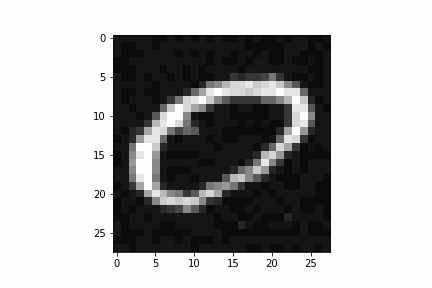

In [ ]:
with open(gifs_dir + 'diffusion.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

In [ ]:
# upsample operation in the UNET
class Downsample(hk.Module):
  def __init__(self, output_channels):
    super().__init__()
    self.conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(4, 4), stride=2, padding=[1, 1])
  
  def __call__(self, x):
    return self.conv(x)
  
# Downsample operation in the UNET
class Upsample(hk.Module):
  def __init__(self, output_channels):
    super().__init__()
    self.conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(3, 3), padding='SAME')
  
  def __call__(self, x):
    # scaling image to twice size
    x = einops.repeat(x, 'b h w c -> b (a h) (aa w) c', a=2, aa=2)
    return self.conv(x)
      
class TimeEmbeddings(hk.Module):
  def __init__(self, dim):
    super().__init__()
    half_dim = dim // 2
    embeddings = math.log(10000) / (half_dim - 1)
    self.embeddings = jnp.exp(jnp.arange(half_dim) * -embeddings)

  def __call__(self, timesteps):
      embeddings = self.embeddings
      embeddings = jnp.multiply(timesteps[:, None], embeddings[:, None].T)
      embeddings = jnp.hstack([jnp.sin(embeddings), jnp.cos(embeddings)])
      return embeddings

class Block(hk.Module):
  # a basic resnet style convolutional block
  def __init__(self, output_channels, kernel_size, padding):
    super().__init__()
    self.proj = hk.Conv2D(output_channels=output_channels, kernel_shape=(kernel_size, kernel_size), padding='SAME')
    self.ln = hk.LayerNorm(axis=(-3, -2, -1), create_scale=True, create_offset=True)
    self.seq = hk.Sequential([
      jax.nn.silu,
      hk.Conv2D(output_channels=output_channels, kernel_shape=(kernel_size, kernel_size), padding='SAME'),
      hk.LayerNorm(axis=(-3, -2, -1), create_scale=True, create_offset=True),
      jax.nn.silu,
    ])
    self.out_conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(1, 1), padding='SAME') 
    # self.time_mlp = None
    dims = output_channels
    self.time_mlp = hk.Sequential([
      jax.nn.silu,
      hk.Linear(dims*2),
    ])
    
  def __call__(self, x, timestep_embeddings=None):
    h = self.proj(x)
    h = self.ln(h)
    if timestep_embeddings is not None and self.time_mlp is not None:
      time_embedding = self.time_mlp(timestep_embeddings)
      time_embedding = einops.rearrange(time_embedding, 'b c -> b 1 1 c')
      shift, scale = jnp.split(time_embedding, indices_or_sections=2, axis=-1)
      h = shift + (scale+1)*h
    
    h = self.seq(h)
    return self.out_conv(x) + h

In [ ]:
# Unet class to predict noise from a given image
class UNet(hk.Module):
  def __init__(self):
    super().__init__()
    self.init_conv = hk.Conv2D(output_channels=32, kernel_shape = (5,5), padding='SAME')
    self.silu = jax.nn.silu
    self.block1 = Block(output_channels=32, kernel_size=3, padding=1)
    self.downsample1 = Downsample(64)
    self.block2 = Block(output_channels=64, kernel_size=3, padding=1)
    self.downsample2 = Downsample(128)
    self.middle_block = Block(output_channels=128, kernel_size=3, padding=1)
    self.upsample1 = Upsample(64)
    self.block3 = Block(output_channels=64, kernel_size=3, padding=1)
    self.upsample2 = Upsample(32)
    self.block4 = Block(output_channels=32, kernel_size=3, padding=1)
    self.seq = hk.Sequential([
        hk.Conv2D(output_channels=32, kernel_shape = (3,3), padding='SAME'),
        hk.LayerNorm(axis=(-3, -2, -1), create_scale=True, create_offset=True),
        jax.nn.silu,
        hk.Conv2D(output_channels=1, kernel_shape = (5,5), padding='SAME'),
    ])
    self.time_mlp = hk.Sequential([
      TimeEmbeddings(64),
      hk.Linear(256),
      jax.nn.gelu,
      hk.Linear(256),
    ])
      
  def __call__(self, x, timesteps):
    timesteps_embedding = None
    if timesteps is not None:
      timesteps_embedding = self.time_mlp(timesteps)
    h = self.init_conv(x)
    xx = jnp.copy(h)
    b1 = self.block1(self.silu(h), timesteps_embedding)
    h = self.downsample1(b1)
    b2 = self.block2(h, timesteps_embedding)
    h = self.downsample2(b2)
    h = self.upsample1(self.middle_block(h, timesteps_embedding))
    b3 = self.block3(jnp.concatenate((h, b2), axis=3), timesteps_embedding)
    h = self.upsample2(b3)
    b4 = self.block4(jnp.concatenate((h, b1), axis=3), timesteps_embedding)
    h = self.seq(jnp.concatenate((xx, b4), axis=3))
    return h

In [ ]:
def save(ckpt_dir: str, state, model_name) -> None:
  with open(os.path.join(ckpt_dir, model_name+"_arrays.npy"), "wb") as f:
    for x in jax.tree_util.tree_leaves(state):
         np.save(f, x, allow_pickle=False)
    tree_struct = jax.tree_map(lambda t: 0, state)
  with open(os.path.join(ckpt_dir, model_name+"_tree.pkl"), "wb") as f:
     pickle.dump(tree_struct, f)

def restore(ckpt_dir, model_name):
  with open(os.path.join(ckpt_dir, model_name+"_tree.pkl"), "rb") as f:
    tree_struct = pickle.load(f)
 
  leaves, treedef = jax.tree_util.tree_flatten(tree_struct)
  with open(os.path.join(ckpt_dir, model_name+"_arrays.npy"), "rb") as f:
    flat_state = [np.load(f) for _ in leaves]

  return jax.tree_util.tree_unflatten(treedef, flat_state)

def test_model_save():
  save('saved/saved_models/', avg_params, 'emnist_model')
  avg_params = restore('saved/saved_models/', 'emnist_model')

In [ ]:
import graphviz

def f(x, timesteps):
  unet = UNet()
  return unet(x, timesteps)

f_t = hk.transform(f)
net = hk.without_apply_rng(f_t)

x = normalize(next(train)[0])[0:10] #jnp.ones([100, 28, 28, 1])
timesteps_ = jnp.arange(0, 1)

_, rng = jax.random.split(key)

if cont and os.path.exists(osp.join(model_paths, model_name + '_tree.pkl')):
  params = avg_params = restore(model_paths, model_name)
else:
  params = net.init(rng, x, timesteps_)

# dot = hk.experimental.to_dot(f_t.apply)(params, None, x, timesteps)
# graphviz.Source(dot)

# print(hk.experimental.tabulate(f_t)(x, timesteps_))

opt = optax.adam(1e-3)

avg_params = deepcopy(params)
opt_state = opt.init(params)



---




### Training

In [ ]:
def show_predicted_image(noisy_image, params, timestep):
  print('time step for image', timestep)
  timestep = jnp.array([timestep])
  pred_noise = net.apply(params, noisy_image, timestep)
  pred_image = noisy_image/jnp.sqrt(alphas_[timestep]) - pred_noise*sd[timestep]/jnp.sqrt(alphas_[timestep])
  _, (p1, p2) = plt.subplots(1, 2)
  show_image(unnormalize(pred_image[0]), p1)
  show_image(unnormalize(noisy_image[0]), p2)
  plt.show()
  return huber_loss(noisy_image, pred_image)
  
# show random images
# show_predicted_image(x, avg_params, 10)

In [ ]:
b, l = next(train)
b = normalize(b)

unique_key = jax.random.fold_in(key, jnp.sum(b))
_, *subkeys = jax.random.split(unique_key, timesteps)

time step for image 199


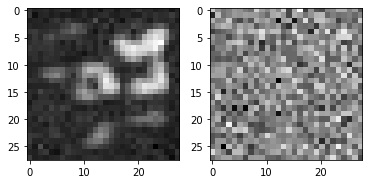

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

[894.30273]


In [ ]:
def test_loss_fn():
  loss_ = []
  huber_loss_ = []
  huber_loss_weighted = []
  imp_weight_ = []
  model_huber_loss = []
  for i in range(1, timesteps):
    tt = jnp.array([i])
    data_noisy_temp, noise_temp = get_noisy(subkeys[i-1], b, tt)
    loss_.append(jax.device_get(compute_loss(avg_params, [einops.rearrange(data_noisy_temp[0], 'h w c -> 1 h w c'), jax.nn.one_hot(l, 63), tt, 
                                                          einops.rearrange(noise_temp[0], 'h w c -> 1 h w c')], False)))
    huber_loss__ = huber_loss(data_noisy_temp[0:2], b[0:2])
    huber_loss_.append(huber_loss__)
    
    imp_weight = 1/2 * (1/sigma_squared_q_t_corrected[tt]) * ((betas[tt])**2 / (variance[tt] * alphas[tt]))
    # loss on prediction
    huber_loss_weighted.append(jnp.sum(jnp.multiply(imp_weight, huber_loss__)))
    imp_weight_.append(imp_weight)
    
    pp = net.apply(avg_params, einops.rearrange(data_noisy_temp[0], 'h w c -> 1 h w c'), tt)
    model_huber_loss.append(huber_loss(einops.rearrange(pp[0], 'h w c -> 1 h w c'), einops.rearrange(noise_temp[0], 'h w c -> 1 h w c')))
    
  print(show_predicted_image(einops.rearrange(data_noisy_temp[0], 'h w c -> 1 h w c'), avg_params, i))
  return loss_, huber_loss_, huber_loss_weighted, imp_weight_, model_huber_loss
  
loss_, huber_loss_, huber_loss_weighted, imp_weight_, model_huber_loss = test_loss_fn()

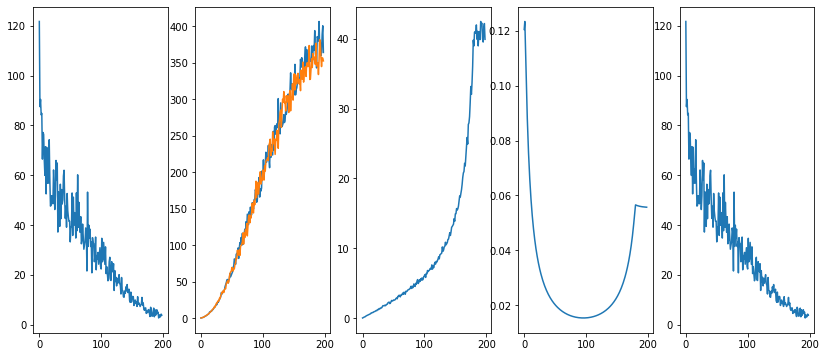

In [ ]:
_, (plt1, plt2, plt3, plt4, plt5) = plt.subplots(1,5, figsize=(14, 6))

plt1.plot(loss_)
plt2.plot(huber_loss_)
plt3.plot(huber_loss_weighted)
plt4.plot(imp_weight_)
plt5.plot(model_huber_loss)

In [ ]:
from copy import deepcopy
import pickle
import sys

batches_iter = 10000

def train_model(opt_state, params, avg_params, model_name, train_new_model=False, energy_method=False):
    best_loss = sys.float_info.max # initialization
        

    if train_new_model or not os.path.exists(osp.join(data_paths, model_name + '_state.pt')):
        # generating sub keys for timesteps
        unique_key = jax.random.fold_in(key, batch_size)
        
        # same subkey being used for noise sampling, as it doesn't matter :)
        _, *timestep_subkeys = jax.random.split(unique_key, batches_iter)
        
        losses = []
        for iteration in range(0, batches_iter):
            data_in_batch, label = next(train)
            data_in_batch = normalize(data_in_batch)
            label_one_hot = jax.nn.one_hot(label, 63)
            idx = (jax.random.uniform(key=timestep_subkeys[iteration], shape=(batch_size, 1)) * (timesteps-1)).astype(int)
            idx = einops.rearrange(idx, 'a b -> (a b)')
            timestep = idx + 1
            data_noisy, noise = get_noisy(timestep_subkeys[iteration], data_in_batch, timestep)
            # todo: call gradient update function here
            loss_value, params, opt_state = update(params, opt_state, [data_noisy, label_one_hot, timestep, noise], energy_method)
            avg_params = ema_update(params, avg_params)
            
            if iteration % 10 == 0:
              print("batch loss value: ", loss_value)
            
            if iteration % 50 == 0:                
                ## evaluating noise on a fixed timestep to calculate best model
                one_timestep = jnp.mod(jnp.arange(1, batch_size+1), timesteps)
                data_noisy_temp, noise_temp = get_noisy(timestep_subkeys[iteration], data_in_batch, one_timestep)
                loss_temp = jax.device_get(compute_loss(avg_params, [data_noisy_temp, label_one_hot, one_timestep, noise_temp], energy_method))
                losses.append(loss_temp)
            
                if loss_temp < best_loss:
                    best_loss = loss_temp
                    print(f"saving iteration: {iteration} loss: {best_loss:>7f}")
                    save(model_paths, avg_params, model_name)
                    write_cached([data_noisy, data_in_batch, timestep, losses], osp.join(data_paths, model_name + '_state.pt'))
                    # sample a random number
                    r_ = (jax.random.uniform(timestep_subkeys[iteration])*batch_size).astype(int)
                    show_predicted_image(einops.rearrange(data_noisy_temp[r_], 'h w c -> 1 h w c'), avg_params, one_timestep[r_])
            
                if iteration % 100 == 0:
                    print(f"iteration: {iteration} loss: {loss_temp:>7f}")

    if os.path.exists(osp.join(data_paths, model_name + '_state.pt')):
        avg_params = restore(model_paths, model_name)
        data_noisy, data_in_batch, timestep, losses = load_cached(osp.join(data_paths, model_name + '_state.pt')) 
    return data_noisy, data_in_batch, timestep, losses, avg_params

batch loss value:  13919.488
saving iteration: 0 loss: 22404.570312
time step for image 26


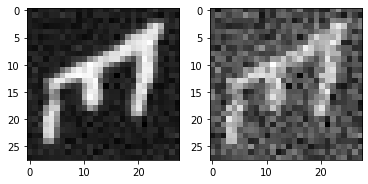

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 0 loss: 22404.570312
batch loss value:  9753.824
batch loss value:  7557.452
batch loss value:  7514.9673
batch loss value:  7105.6777
batch loss value:  6880.584
saving iteration: 50 loss: 7919.708496
time step for image 9


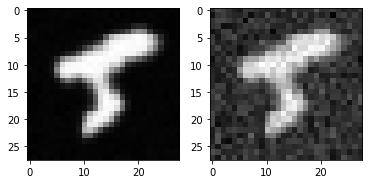

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  6827.0566
batch loss value:  6783.262
batch loss value:  6714.75
batch loss value:  6638.855
batch loss value:  6608.309
saving iteration: 100 loss: 7564.799805
time step for image 10


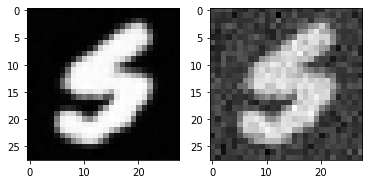

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 100 loss: 7564.799805
batch loss value:  6302.045
batch loss value:  6279.6553
batch loss value:  6254.6943
batch loss value:  6349.1396
batch loss value:  6527.219
saving iteration: 150 loss: 7281.492676
time step for image 32


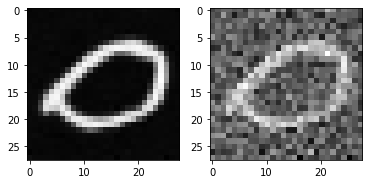

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  6231.502
batch loss value:  6932.209
batch loss value:  6510.5312
batch loss value:  6533.765
batch loss value:  6620.1147
saving iteration: 200 loss: 7161.372070
time step for image 48


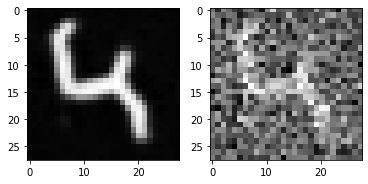

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 200 loss: 7161.372070
batch loss value:  6208.3076
batch loss value:  6009.38
batch loss value:  6004.649
batch loss value:  6173.4365
batch loss value:  6214.116
saving iteration: 250 loss: 7098.954102
time step for image 39


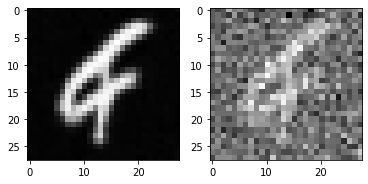

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  6342.3296
batch loss value:  6206.908
batch loss value:  6639.324
batch loss value:  5810.303
batch loss value:  6568.456
iteration: 300 loss: 7202.504395
batch loss value:  6103.169
batch loss value:  6039.7417
batch loss value:  5863.952
batch loss value:  6195.424
batch loss value:  6037.653
saving iteration: 350 loss: 6857.476562
time step for image 166


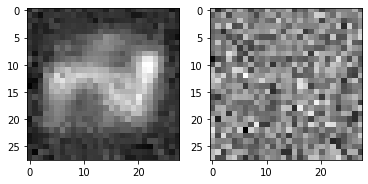

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  6078.7563
batch loss value:  6022.163
batch loss value:  5918.752
batch loss value:  6032.6143
batch loss value:  6391.1924
saving iteration: 400 loss: 6724.549805
time step for image 17


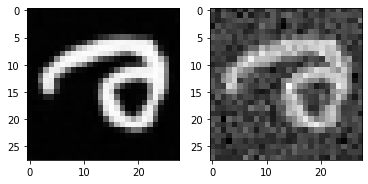

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 400 loss: 6724.549805
batch loss value:  6039.958
batch loss value:  6309.3774
batch loss value:  6235.54
batch loss value:  6301.2793
batch loss value:  5798.6436
batch loss value:  5934.0234
batch loss value:  5797.8394
batch loss value:  6173.934
batch loss value:  7002.531
batch loss value:  6498.852
iteration: 500 loss: 6971.303711
batch loss value:  5867.2637
batch loss value:  6224.001
batch loss value:  5881.166
batch loss value:  5771.726
batch loss value:  5933.968
batch loss value:  5722.2607
batch loss value:  6017.575
batch loss value:  5610.4414
batch loss value:  6177.8936
batch loss value:  5922.802
saving iteration: 600 loss: 6662.686523
time step for image 50


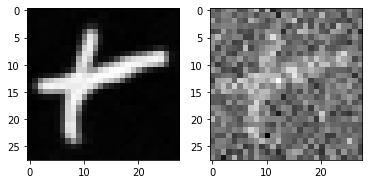

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 600 loss: 6662.686523
batch loss value:  6120.346
batch loss value:  5866.64
batch loss value:  5592.4785
batch loss value:  5679.0957
batch loss value:  5709.4463
batch loss value:  6303.118
batch loss value:  5700.6406
batch loss value:  5930.896
batch loss value:  5907.182
batch loss value:  5244.551
saving iteration: 700 loss: 6477.723633
time step for image 105


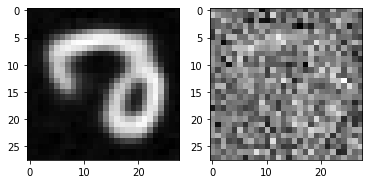

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 700 loss: 6477.723633
batch loss value:  6191.4414
batch loss value:  5509.5283
batch loss value:  5902.1064
batch loss value:  5414.8125
batch loss value:  5508.3516
batch loss value:  5981.893
batch loss value:  5694.309
batch loss value:  5881.3286
batch loss value:  5284.878
batch loss value:  5732.201
iteration: 800 loss: 6830.310059
batch loss value:  5818.3613
batch loss value:  6661.0674
batch loss value:  5903.663
batch loss value:  5610.6045
batch loss value:  5937.1934
batch loss value:  5534.0483
batch loss value:  5665.7095
batch loss value:  6138.6465
batch loss value:  5598.4736
batch loss value:  5991.374
iteration: 900 loss: 6625.919922
batch loss value:  5723.493
batch loss value:  5733.542
batch loss value:  5941.343
batch loss value:  5512.073
batch loss value:  5863.167
batch loss value:  6080.617
batch loss value:  5573.791
batch loss value:  5661.837
batch loss value:  5961.6016
batch loss value:  5763.697
iteration: 1000 loss: 6566.403809
batch loss v

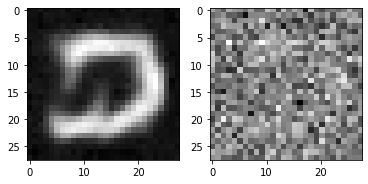

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  6325.4595
batch loss value:  5463.7817
batch loss value:  5658.5303
batch loss value:  5607.561
batch loss value:  6281.3857
iteration: 1100 loss: 6663.664062
batch loss value:  6433.959
batch loss value:  5515.831
batch loss value:  5802.2524
batch loss value:  5878.5225
batch loss value:  5633.137
batch loss value:  5555.596
batch loss value:  6057.5723
batch loss value:  5811.758
batch loss value:  5513.91
batch loss value:  5934.225
saving iteration: 1200 loss: 6440.641602
time step for image 88


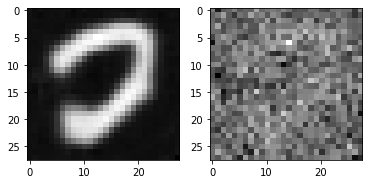

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 1200 loss: 6440.641602
batch loss value:  5765.3037
batch loss value:  5817.3877
batch loss value:  5918.9824
batch loss value:  5946.954
batch loss value:  5165.829
batch loss value:  5346.117
batch loss value:  5451.339
batch loss value:  5748.678
batch loss value:  5379.826
batch loss value:  6032.327
iteration: 1300 loss: 6509.512207
batch loss value:  5855.9614
batch loss value:  6068.3
batch loss value:  5809.2773
batch loss value:  5531.7295
batch loss value:  5466.658
batch loss value:  5344.595
batch loss value:  5913.1733
batch loss value:  5504.525
batch loss value:  5659.2495
batch loss value:  5774.0903
iteration: 1400 loss: 6654.594727
batch loss value:  5591.1846
batch loss value:  5689.4756
batch loss value:  5694.685
batch loss value:  5846.5557
batch loss value:  5701.326
saving iteration: 1450 loss: 6419.601562
time step for image 71


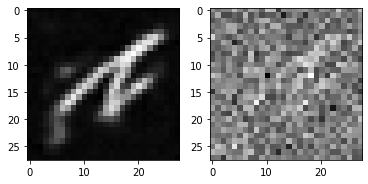

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5737.106
batch loss value:  6234.4395
batch loss value:  5921.665
batch loss value:  5351.0977
batch loss value:  5866.3545
saving iteration: 1500 loss: 6345.750488
time step for image 69


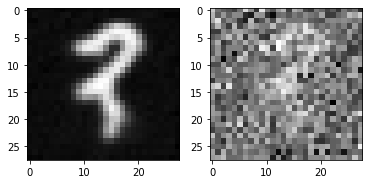

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 1500 loss: 6345.750488
batch loss value:  6183.924
batch loss value:  6009.159
batch loss value:  6251.413
batch loss value:  5507.427
batch loss value:  5905.6455
batch loss value:  5647.839
batch loss value:  5857.129
batch loss value:  5343.2856
batch loss value:  5576.0986
batch loss value:  5849.9526
iteration: 1600 loss: 6446.622559
batch loss value:  5419.1816
batch loss value:  5905.499
batch loss value:  5449.9814
batch loss value:  5690.2427
batch loss value:  5510.291
saving iteration: 1650 loss: 6317.460938
time step for image 185


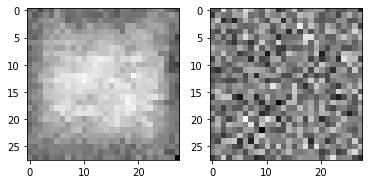

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5765.8525
batch loss value:  5716.4155
batch loss value:  5514.553
batch loss value:  5255.9395
batch loss value:  6089.0693
iteration: 1700 loss: 6493.663086
batch loss value:  5478.624
batch loss value:  5948.303
batch loss value:  5612.412
batch loss value:  5714.1
batch loss value:  5783.6797
saving iteration: 1750 loss: 6292.363770
time step for image 189


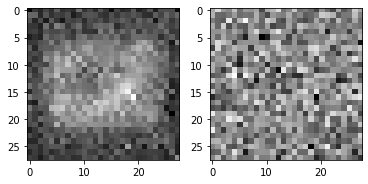

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5426.884
batch loss value:  5591.099
batch loss value:  5738.7246
batch loss value:  5723.3105
batch loss value:  5583.7354
iteration: 1800 loss: 6435.604004
batch loss value:  5448.0176
batch loss value:  5758.995
batch loss value:  5425.7295
batch loss value:  5802.828
batch loss value:  5950.9883
batch loss value:  5840.7036
batch loss value:  5439.149
batch loss value:  5852.604
batch loss value:  5781.4907
batch loss value:  5512.4287
iteration: 1900 loss: 6482.531250
batch loss value:  5270.664
batch loss value:  5724.502
batch loss value:  5466.2944
batch loss value:  5974.7266
batch loss value:  5671.7236
batch loss value:  5110.898
batch loss value:  5338.668
batch loss value:  5514.3755
batch loss value:  5602.176
batch loss value:  5169.055
saving iteration: 2000 loss: 6291.841797
time step for image 106


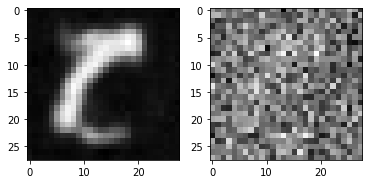

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 2000 loss: 6291.841797
batch loss value:  5515.585
batch loss value:  5641.851
batch loss value:  5452.025
batch loss value:  5841.39
batch loss value:  5752.246
batch loss value:  4940.962
batch loss value:  5958.207
batch loss value:  5539.2197
batch loss value:  5352.4067
batch loss value:  5397.577
iteration: 2100 loss: 6475.033203
batch loss value:  5793.126
batch loss value:  5728.39
batch loss value:  5241.6113
batch loss value:  5617.177
batch loss value:  6030.9736
batch loss value:  5409.0645
batch loss value:  5241.336
batch loss value:  5828.791
batch loss value:  5484.303
batch loss value:  5378.0244
iteration: 2200 loss: 6405.341309
batch loss value:  5084.6543
batch loss value:  5587.635
batch loss value:  5848.973
batch loss value:  5212.578
batch loss value:  5477.5894
batch loss value:  5645.35
batch loss value:  5295.1553
batch loss value:  5674.0957
batch loss value:  5756.9746
batch loss value:  5671.211
iteration: 2300 loss: 6486.207031
batch loss value

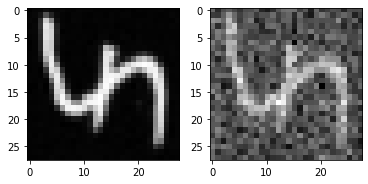

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5477.784
batch loss value:  5111.9395
batch loss value:  5394.392
batch loss value:  5683.802
batch loss value:  5416.1855
iteration: 2500 loss: 6358.142578
batch loss value:  5647.0137
batch loss value:  5593.4976
batch loss value:  5732.009
batch loss value:  5443.5215
batch loss value:  5599.073
batch loss value:  5239.5366
batch loss value:  5912.2246
batch loss value:  5538.133
batch loss value:  5667.208
batch loss value:  5654.697
iteration: 2600 loss: 6383.749512
batch loss value:  5359.0884
batch loss value:  5238.837
batch loss value:  5584.9165
batch loss value:  5673.3486
batch loss value:  5734.5527
saving iteration: 2650 loss: 6186.575684
time step for image 49


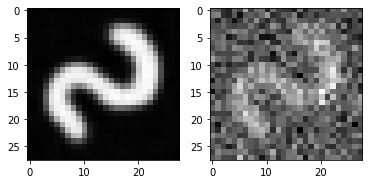

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5176.1797
batch loss value:  5426.002
batch loss value:  5708.494
batch loss value:  5719.2217
batch loss value:  5364.6543
iteration: 2700 loss: 6242.187012
batch loss value:  5335.652
batch loss value:  5581.99
batch loss value:  5232.756
batch loss value:  5775.7363
batch loss value:  5485.1787
saving iteration: 2750 loss: 6088.613281
time step for image 169


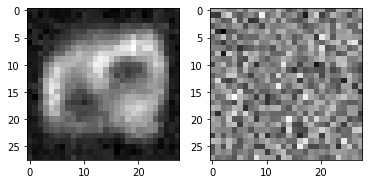

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5198.2295
batch loss value:  5278.79
batch loss value:  5331.6284
batch loss value:  5237.9985
batch loss value:  5014.593
iteration: 2800 loss: 6257.926270
batch loss value:  5558.0796
batch loss value:  5148.578
batch loss value:  5397.329
batch loss value:  5852.172
batch loss value:  5465.235
batch loss value:  5529.5244
batch loss value:  5236.174
batch loss value:  5673.922
batch loss value:  6091.371
batch loss value:  5910.3174
iteration: 2900 loss: 6346.483887
batch loss value:  5619.684
batch loss value:  5930.9365
batch loss value:  4945.951
batch loss value:  5429.7773
batch loss value:  5498.2676
batch loss value:  5482.3525
batch loss value:  5641.907
batch loss value:  5389.9736
batch loss value:  5481.6924
batch loss value:  5382.5186
iteration: 3000 loss: 6271.937988
batch loss value:  5698.0312
batch loss value:  5419.2207
batch loss value:  5239.21
batch loss value:  6046.247
batch loss value:  5800.863
batch loss value:  5281.0376
batch loss value

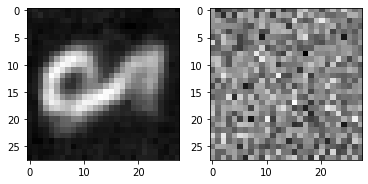

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 3100 loss: 5963.449219
batch loss value:  5659.984
batch loss value:  5464.081
batch loss value:  5580.7236
batch loss value:  5524.1343
batch loss value:  5791.2666
batch loss value:  5376.1553
batch loss value:  5559.8267
batch loss value:  5478.0327
batch loss value:  5131.0938
batch loss value:  5553.501
iteration: 3200 loss: 6089.316406
batch loss value:  5187.242
batch loss value:  5465.8535
batch loss value:  5696.4336
batch loss value:  5733.401
batch loss value:  5503.175
batch loss value:  5141.0767
batch loss value:  5746.8896
batch loss value:  5443.3623
batch loss value:  5365.3936
batch loss value:  5610.9595
iteration: 3300 loss: 6199.713379
batch loss value:  5377.587
batch loss value:  5489.6816
batch loss value:  5066.6484
batch loss value:  5791.4395
batch loss value:  5192.8174
batch loss value:  5566.965
batch loss value:  5258.3677
batch loss value:  5776.4316
batch loss value:  5424.725
batch loss value:  5242.767
iteration: 3400 loss: 6025.292969
batc

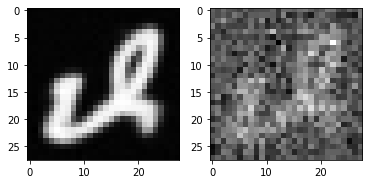

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5387.5903
batch loss value:  5710.4653
batch loss value:  5902.1816
batch loss value:  5498.519
batch loss value:  5603.259
iteration: 4300 loss: 6193.625977
batch loss value:  5550.6113
batch loss value:  5740.258
batch loss value:  4966.7295
batch loss value:  5024.6313
batch loss value:  5646.582
batch loss value:  5384.8926
batch loss value:  5230.389
batch loss value:  5446.6885
batch loss value:  5471.691
batch loss value:  5190.7246
iteration: 4400 loss: 5856.374023
batch loss value:  5772.559
batch loss value:  5567.586
batch loss value:  5377.09
batch loss value:  5254.9087
batch loss value:  5436.7886
batch loss value:  5282.2334
batch loss value:  5238.161
batch loss value:  5089.013
batch loss value:  5827.048
batch loss value:  5258.213
iteration: 4500 loss: 6229.568359
batch loss value:  5546.84
batch loss value:  5486.4736
batch loss value:  4820.2744
batch loss value:  5094.6846
batch loss value:  5226.2876
batch loss value:  5301.2656
batch loss valu

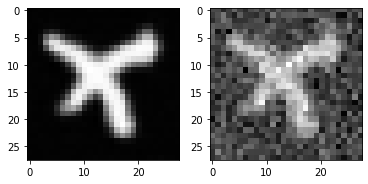

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 5900 loss: 5825.588379
batch loss value:  5042.107
batch loss value:  5623.317
batch loss value:  5323.3203
batch loss value:  5093.9062
batch loss value:  5046.768
batch loss value:  5331.588
batch loss value:  5092.127
batch loss value:  5274.623
batch loss value:  5207.2915
batch loss value:  5024.8193
iteration: 6000 loss: 6140.466797
batch loss value:  5458.6514
batch loss value:  5258.002
batch loss value:  5219.2646
batch loss value:  5286.162
batch loss value:  4992.581
batch loss value:  5483.7373
batch loss value:  5006.051
batch loss value:  5610.2705
batch loss value:  5386.795
batch loss value:  5026.5615
iteration: 6100 loss: 6184.210938
batch loss value:  4984.8096
batch loss value:  5410.2744
batch loss value:  5389.092
batch loss value:  5309.96
batch loss value:  5381.03
batch loss value:  5205.419
batch loss value:  5417.5347
batch loss value:  5234.783
batch loss value:  5468.186
batch loss value:  5264.7705
iteration: 6200 loss: 5904.761719
batch loss va

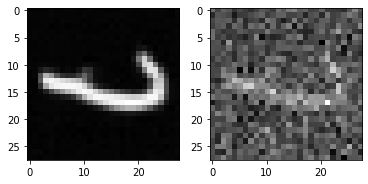

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 6700 loss: 5807.556641
batch loss value:  5203.665
batch loss value:  5153.4136
batch loss value:  5126.5767
batch loss value:  5726.5137
batch loss value:  4880.2393
batch loss value:  5276.4062
batch loss value:  5425.607
batch loss value:  5727.7085
batch loss value:  5200.6953
batch loss value:  5182.5684
iteration: 6800 loss: 5926.425781
batch loss value:  5185.05
batch loss value:  5391.263
batch loss value:  5219.3438
batch loss value:  5206.3394
batch loss value:  5172.9526
batch loss value:  5089.3906
batch loss value:  5302.7
batch loss value:  5192.407
batch loss value:  5139.471
batch loss value:  5389.5615
iteration: 6900 loss: 5976.880859
batch loss value:  5467.046
batch loss value:  5275.586
batch loss value:  5341.3506
batch loss value:  5336.1094
batch loss value:  5637.3765
batch loss value:  5451.122
batch loss value:  5374.3374
batch loss value:  5060.5093
batch loss value:  5239.627
batch loss value:  4941.5674
saving iteration: 7000 loss: 5683.510742
t

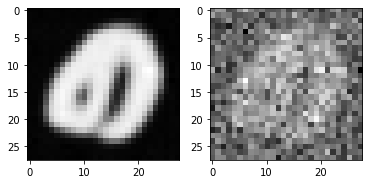

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 7000 loss: 5683.510742
batch loss value:  5047.995
batch loss value:  5227.009
batch loss value:  5141.998
batch loss value:  5584.403
batch loss value:  5378.0596
batch loss value:  5569.052
batch loss value:  5224.957
batch loss value:  4770.439
batch loss value:  5243.416
batch loss value:  5049.8184
iteration: 7100 loss: 5940.677734
batch loss value:  5010.253
batch loss value:  5262.3525
batch loss value:  5283.3994
batch loss value:  5342.461
batch loss value:  5370.743
batch loss value:  5011.794
batch loss value:  5273.025
batch loss value:  5504.9277
batch loss value:  5441.3335
batch loss value:  5010.6484
saving iteration: 7200 loss: 5610.754883
time step for image 187


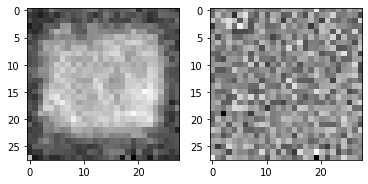

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

iteration: 7200 loss: 5610.754883
batch loss value:  5223.1147
batch loss value:  4988.8564
batch loss value:  5153.4883
batch loss value:  5421.4937
batch loss value:  5414.8413
batch loss value:  5212.74
batch loss value:  5210.6597
batch loss value:  5293.757
batch loss value:  4941.2334
batch loss value:  5116.703
iteration: 7300 loss: 5941.579590
batch loss value:  5367.385
batch loss value:  5151.4785
batch loss value:  5890.5576
batch loss value:  4805.117
batch loss value:  5337.93
batch loss value:  5093.571
batch loss value:  5118.2686
batch loss value:  5264.452
batch loss value:  4922.9272
batch loss value:  5265.719
iteration: 7400 loss: 5865.952637
batch loss value:  4793.06
batch loss value:  4738.4775
batch loss value:  5311.496
batch loss value:  4951.6543
batch loss value:  5117.509
batch loss value:  5640.0767
batch loss value:  5306.6
batch loss value:  5666.7354
batch loss value:  5184.079
batch loss value:  5287.3345
iteration: 7500 loss: 5843.763672
batch loss va

IndexError: ignored

In [ ]:
data_noisy, data_in_batch, timestep, losses, avg_params = train_model(opt_state, params, avg_params, model_name, train_new_model = train_new_model, energy_method=False)
plt.plot(losses)

In [ ]:
def param_count(pytree):
  return sum(x.size for x in jax.tree_util.tree_leaves(pytree))

param_count(avg_params)

1082657

## Full generation model

In [ ]:
mean_coeff_1 = jnp.sqrt(alphas)*(1 - alphas_prev_) / variance
mean_coeff_2 = jnp.sqrt(alphas_prev_) * betas / variance

In [ ]:
def generate_data(avg_params, energy_method=False, clipped_version=False, labels=None):
    batch_size_generation = 1
    unique_key = jax.random.fold_in(key, 0)
    _, subkey = jax.random.split(unique_key)
    _, *subkeys = jax.random.split(unique_key, timesteps+1)
    
    # need to generate new keys everytime
    data_noisy = jax.random.normal(subkey, shape=(batch_size_generation, 28, 28, 1))
    data_orig = normalize(next(train)[0][0:batch_size_generation])
    data_noisy, _ = get_noisy(subkey, data_orig, jnp.array([timesteps]))
      
    datas = []
    datas.append(jax.device_get(data_noisy))
    data_in_batch = data_noisy

    for t in range(1, timesteps+1):
        timestep = timesteps-t
        t_repeated = jnp.repeat(jnp.array([timestep]), batch_size_generation)
        # data_stacked = torch.vstack([data_in_batch, labelled_values])
        pred_data = net.apply(avg_params, data_in_batch, t_repeated)
        if not clipped_version:
            if not energy_method:
                # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                multiplier = jnp.exp(jnp.log((betas[timestep])) - jnp.log(sd[timestep]))
                mean_data = jnp.subtract(data_in_batch, pred_data * multiplier)/jnp.sqrt(alphas[timestep])
            else:
                ##
                # Energy function interpretation
                mean_data = jnp.add(data_in_batch, pred_data * betas[timestep])/jnp.sqrt(alphas[timestep])
                ##
        else:
            # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
            # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
            if not energy_method:
                x_reconstructed = jnp.subtract(data_in_batch, pred_data * sd[timestep])/ jnp.sqrt(alphas_[timestep])
            else:
                # energy method and clipping to improve stabalization
                x_reconstructed = jnp.add(data_in_batch, pred_data * variance[timestep])/ jnp.sqrt(alphas_[timestep])

            if timestep >= 0:
                x_reconstructed = jnp.clip(x_reconstructed, 0., 1.)

            mean_data_1 = data_in_batch * mean_coeff_1[timestep]
            mean_data_2 = x_reconstructed * mean_coeff_2[timestep]
            mean_data = jnp.add(mean_data_1, mean_data_2)

        posterior_data = posterior_variance_corrected[timestep]
        data_noisy = jax.random.normal(subkeys[t-1], shape=(batch_size_generation, 28, 28, 1))
        data_in_batch = jnp.add(mean_data,  jnp.sqrt(posterior_data) * data_noisy)
        datas.append(jax.device_get(data_in_batch))
    return datas, data_in_batch, data_orig

In [ ]:
datas, data_in_batch, data_orig = generate_data(avg_params, energy_method=False, clipped_version=True, labels="mixed")

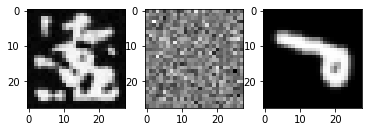

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

In [ ]:
_, (plt1, plt2, plt3) = plt.subplots(1, 3)
show_image((data_in_batch[0]), plt1)
show_image((datas[0][0]), plt2)
show_image((data_orig[0]), plt3)

# data_noisy, _ = get_noisy(data_orig, jnp.array([60]))
# show_image(unnormalize(data_noisy[0]), plt1)

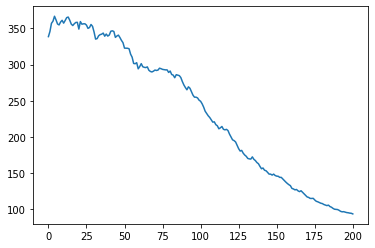

In [ ]:
plt.plot([huber_loss(datas[i], data_orig) for i in range(len(datas))]) #, huber_loss(data_in_batch, data_orig), huber_loss(data_in_batch, datas[10])

In [ ]:
%%capture 

fig = plt.figure()
ims = []

if colab:
  datas = einops.rearrange(datas, 'x b h w c -> x b h (w c)')
  
for data in datas:
    im = plt.imshow(data[0], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir + 'diffusion_generation_full.gif', writer='pillow')

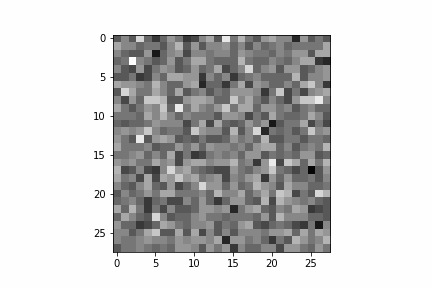

In [ ]:
with open(gifs_dir + 'diffusion_generation_full.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

## strided sampling

In [ ]:
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance[1], posterior_variance[1:]]))
posterior_variance_corrected = jnp.exp(log_posterior_variance)

strided_schedule = jnp.array(list(range(1, timesteps, 2)) + [timesteps])

alphas_strided_ = alphas_[strided_schedule]
alphas_prev_strided_ = jnp.pad(alphas_strided_[:-1], [1, 0], "constant", constant_values=1.0)

betas_strided = 1 - (alphas_strided_/alphas_prev_strided_)
posterior_variance_new_schedule = betas_strided * (1 - alphas_prev_strided_)/ (1-alphas_strided_)
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance_new_schedule[1], posterior_variance_new_schedule[1:]]))
posterior_variance_new_schedule_corrected = jnp.exp(log_posterior_variance)

In [ ]:
mean_coeff_1 = jnp.sqrt(1-betas_strided)*(1 - alphas_prev_strided_) / (1 - alphas_strided_)
mean_coeff_2 = jnp.sqrt(alphas_prev_strided_) * betas_strided / (1 - alphas_strided_)

In [ ]:
def generate_data(avg_params, energy_method=False, clipped_version=False, labels=None):
    batch_size_generation = 1
    
    unique_key = jax.random.fold_in(key, 1)
    _, subkey = jax.random.split(unique_key)
    _, *subkeys = jax.random.split(unique_key, len(strided_schedule)+1)
    
    data_noisy = jax.random.normal(subkey, shape=(batch_size_generation, 28, 28, 1))
    data_orig = normalize(next(train)[0][0:batch_size_generation])
    data_noisy, _ = get_noisy(subkey, data_orig, jnp.array([timesteps]))
          
    datas = []
    datas.append(jax.device_get(data_noisy))
    data_in_batch = data_noisy                               
    for t in range(1, len(strided_schedule)+1):
        stride_timestep = len(strided_schedule)-t
        timestep = strided_schedule[stride_timestep]
        t_repeated = jnp.repeat(jnp.array([timestep]), batch_size_generation)
        # data_stacked = torch.vstack([data_in_batch, labelled_values])
        pred_data = net.apply(avg_params, data_in_batch, t_repeated)
        if not clipped_version:
            if not energy_method:
                # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                multiplier = jnp.exp(jnp.log((betas_strided[stride_timestep])) - jnp.log(jnp.sqrt(1- alphas_strided_[stride_timestep])))
                mean_data = jnp.subtract(data_in_batch, pred_data * multiplier)/jnp.sqrt(1-betas_strided[stride_timestep])
            else:
                ##
                # Energy function interpretation
                mean_data = jnp.add(data_in_batch, pred_data * betas_strided[stride_timestep])/jnp.sqrt(1-betas_strided[stride_timestep])
                ##
        else:
            # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
            # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
            if not energy_method:
                x_reconstructed = jnp.subtract(data_in_batch, pred_data * sd[timestep])/ jnp.sqrt(alphas_[timestep])
            else:
                # energy method and clipping to improve stabalization
                x_reconstructed = jnp.add(data_in_batch, pred_data * variance[timestep])/ jnp.sqrt(alphas_[timestep])

            if timestep >= 5:
                x_reconstructed = jnp.clip(x_reconstructed, 0., 1.)

            mean_data_1 = data_in_batch * mean_coeff_1[stride_timestep]
            mean_data_2 = x_reconstructed * mean_coeff_2[stride_timestep]
            mean_data = jnp.add(mean_data_1, mean_data_2)



        posterior_data = posterior_variance_new_schedule_corrected[stride_timestep]
        data_noisy = jax.random.normal(subkeys[t-1], shape=(batch_size_generation, 28, 28, 1))
        data_in_batch = jnp.add(mean_data,  jnp.sqrt(posterior_data) * data_noisy)
        datas.append(jax.device_get(data_in_batch))
    return datas, data_in_batch, data_orig

In [ ]:
datas, data_in_batch, data_orig = generate_data(avg_params, energy_method=False, clipped_version=True, labels="mixed")

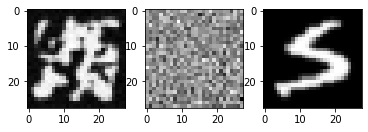

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

In [ ]:
_, (plt1, plt2, plt3) = plt.subplots(1, 3)

show_image(unnormalize(data_in_batch[0]), plt1)
show_image(unnormalize(datas[0][0]), plt2)
show_image(unnormalize(data_orig[0]), plt3)

# data_noisy, _ = get_noisy(data_orig, jnp.array([60]))
# show_image(unnormalize(data_noisy[0]), plt1)

In [ ]:
huber_loss(datas[0], data_orig), huber_loss(data_in_batch, data_orig), huber_loss(data_in_batch, datas[50])

(DeviceArray([371.21472], dtype=float32),
 DeviceArray([80.11302], dtype=float32),
 DeviceArray([195.61475], dtype=float32))

In [ ]:
%%capture 

fig = plt.figure()
ims = []

if colab:
  datas = einops.rearrange(datas, 'x b h w c -> x b h (w c)')
  
for data in datas:
    im = plt.imshow(data[0], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir + 'diffusion_generation_strided.gif', writer='pillow')

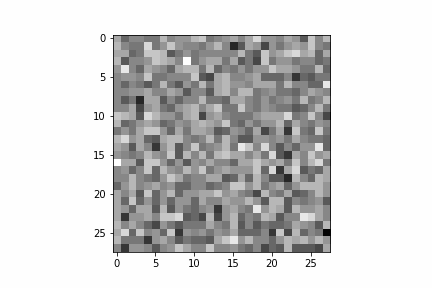

In [ ]:
with open(gifs_dir + 'diffusion_generation_strided.gif','rb') as f:
  display(Image(data=f.read(), format='png'))